AMMI 2023 Bootcamp




# Installing the detectron2

In [1]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp310-cp310-linux_x86_64.whl size=44091 sha256=da55fe9186b557135d9174e472bc1725f5253a7c3eb0ffc9235eea6aebb675e5
  Stored in directory: /root/.cache/pip/wheels/70/83/31/975b737609aba39a4099d471d5684141c1fdc3404f97e7f68a
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.1
    Uninstalling PyYAML-6.0.1:
      Successfully uninstalled PyYAML-6.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2023.8.0 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
distributed 2023.8.0 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
flax 0.7.2 requires PyYAML>=5.4.1, but you have pyyaml 5.1 which is incompatible.

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  cu118
detectron2: 0.6


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom dataset

OPEN IMAGES SUBSET

## Prepare the dataset

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
import pandas as pd

# Load class descriptions
class_descriptions_file = '/content/drive/MyDrive/twenty_class/csv_folder/class-descriptions-boxable.csv'
class_descriptions_df = pd.read_csv(class_descriptions_file, header=None, names=['LabelName', 'ClassName'])
class_dict = dict(zip(class_descriptions_df['LabelName'], class_descriptions_df['ClassName']))
print(class_descriptions_df.head(5))

     LabelName   ClassName
0    /m/011k07    Tortoise
1  /m/011q46kg   Container
2    /m/012074      Magpie
3    /m/0120dh  Sea turtle
4    /m/01226z    Football


In [6]:
from PIL import Image

def get_image_size(image_path):
    with Image.open(image_path) as img:
        return img.size  # Returns a tuple (width, height)

In [7]:
import os

def load_oid_dataset(train_data_url, val_data_url):
    def load_data(data_path):
        data = []
        class_labels = []

        for class_name in os.listdir(data_path):
            class_dir = os.path.join(data_path, class_name)

            if not os.path.isdir(class_dir):
                continue

            class_labels.append(class_name)

            for image_file in os.listdir(class_dir):
                if image_file.endswith('.jpg'):
                    image_id = os.path.splitext(image_file)[0]
                    image_path = os.path.join(class_dir, image_file)
                    image_width, image_height = get_image_size(image_path)

                    annotation_file = os.path.join(class_dir, 'Label', f'{image_id}.txt')

                    with open(annotation_file, 'r') as f:
                        lines = f.readlines()

                    bbox_annotations = []
                    for line in lines:
                        values = line.strip().split()
                        class_label = '_'.join(values[:len(values)-4])
                        x_min, y_min, x_max, y_max = map(float, values[len(values)-4:])
                        bbox_annotations.append({
                            'bbox': [x_min, y_min, x_max, y_max],
                            'category_id': class_label
                        })

                    data.append({
                        'file_name': image_path,
                        'image_id': image_id,
                        'height': image_height,
                        'width': image_width,
                        'annotations': bbox_annotations
                    })
        return data, class_labels

    train_data, train_class_labels = load_data(train_data_url)
    val_data, val_class_labels = load_data(val_data_url)
    # test_data, test_class_labels = load_data(test_data_url)

    return train_data, val_data, train_class_labels, val_class_labels

# URLs to the directories containing class subfolders for train, validation, and test data
train_data_url = '/content/drive/MyDrive/twenty_class/train'
val_data_url = '/content/drive/MyDrive/twenty_class/validation'
# test_data_url = '/content/drive/MyDrive/OIDv4_ToolKit/OID/Dataset/test'

train_data, val_data, train_class_labels, val_class_labels = load_oid_dataset(train_data_url, val_data_url)

# Print the first element in the train dataset

# Print the class labels
print(train_class_labels)


['Torch', 'Toilet paper', 'Sunglasses', 'Spoon', 'Sock', 'Sandal', 'Remote control', 'Power plugs and sockets', 'Plate', 'Pen', 'Necklace', 'Mug', 'Mobile phone', 'Laptop', 'Kitchen knife', 'Headphones', 'Glove', 'Bottle', 'Belt', 'Ball']


In [8]:
import json

def generate_coco_annotations(data, class_labels, save_path):
    # Create COCO format dictionary
    coco_data = {
        "info": {},
        "licenses": [],
        "images": [],
        "annotations": [],
        "categories": []
    }

    # Populate categories
    for idx, label in enumerate(class_labels):
        coco_data["categories"].append({
            "id": idx,
            "name": label,
            "supercategory": "object",
        })

    # Populate images and annotations
    for idx, item in enumerate(data):
        image_id = idx
        file_extension = ".jpg"
        image_info = {
            "id": image_id,
            "file_name": item['file_name'],
            "width": item['width'],
            "height": item['height']
        }
        coco_data["images"].append(image_info)

        for annotation in item['annotations']:
            bbox = annotation['bbox']
            x_min, y_min, x_max, y_max = bbox
            width = x_max - x_min
            height = y_max - y_min

            class_label = annotation['category_id'].replace('_', ' ')
            category_id = class_labels.index(class_label)

            annotation_info = {
                "id": len(coco_data["annotations"]),
                "image_id": image_id,
                "category_id": category_id,
                "bbox": [x_min, y_min, width, height],
                "area": width * height,
                "iscrowd": 0,
            }
            coco_data["annotations"].append(annotation_info)

    # Write the COCO format data to a JSON file
    with open(save_path, 'w') as f:
        json.dump(coco_data, f)

    print("COCO format JSON file has been created:", save_path)

# Generate COCO format JSON files for train, validation, and test datasets
train_save_path = '/content/drive/MyDrive/twenty_class/train/coco_annotations_train.json'
val_save_path = '/content/drive/MyDrive/twenty_class/validation/coco_annotations_val.json'
# test_save_path = '/content/drive/MyDrive/OIDv4_ToolKit/OID/Dataset/test/coco_annotations_test.json'

generate_coco_annotations(train_data, train_class_labels, train_save_path)
generate_coco_annotations(val_data, train_class_labels, val_save_path)
# generate_coco_annotations(test_data, train_class_labels, test_save_path)


COCO format JSON file has been created: /content/drive/MyDrive/twenty_class/train/coco_annotations_train.json
COCO format JSON file has been created: /content/drive/MyDrive/twenty_class/validation/coco_annotations_val.json


In [9]:

# # Generate COCO format JSON files for train, validation, and test datasets
# train_save_path = '/content/drive/MyDrive/OIDv4_ToolKit/OID/Dataset/train/coco_annotations_train.json'
# val_save_path = '/content/drive/MyDrive/OIDv4_ToolKit/OID/Dataset/validation/coco_annotations_val.json'
# # test_save_path = '/content/drive/MyDrive/OIDv4_ToolKit/OID/Dataset/test/coco_annotations_test.json'

Register the dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).



In [10]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

from detectron2.structures import BoxMode

def load_custom_dataset(json_path):
    with open(json_path) as f:
        data = json.load(f)

# Convert COCO annotations to Detectron2 format
    dataset_dicts = []
    for idx, img_ann in enumerate(data["images"]):
        record = {}
        record["file_name"] = img_ann["file_name"]
        record["image_id"] = idx
        record["height"] = img_ann["height"]
        record["width"] = img_ann["width"]
        # print(record["file_name"])
        annos = [anno for anno in data["annotations"] if anno["image_id"] == img_ann["id"]]
        objs = []
        for anno in annos:
            obj = {
            "bbox": anno["bbox"],
            "bbox_mode": BoxMode.XYWH_ABS,
            "category_id": anno["category_id"]
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



In [11]:
# Register the custom dataset and metadata
DatasetCatalog.register("train_dataset", lambda: load_custom_dataset(train_save_path))
MetadataCatalog.get("train_dataset").set(thing_classes=train_class_labels)

namespace(name='train_dataset',
          thing_classes=['Torch',
                         'Toilet paper',
                         'Sunglasses',
                         'Spoon',
                         'Sock',
                         'Sandal',
                         'Remote control',
                         'Power plugs and sockets',
                         'Plate',
                         'Pen',
                         'Necklace',
                         'Mug',
                         'Mobile phone',
                         'Laptop',
                         'Kitchen knife',
                         'Headphones',
                         'Glove',
                         'Bottle',
                         'Belt',
                         'Ball'])

In [12]:
dataset_name = "train_dataset"
dataset_metadata = MetadataCatalog.get(dataset_name)
dataset_dicts = DatasetCatalog.get(dataset_name)

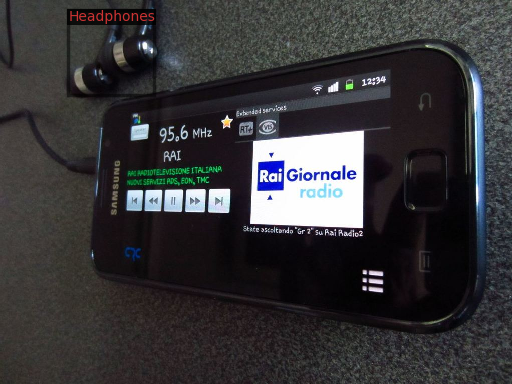

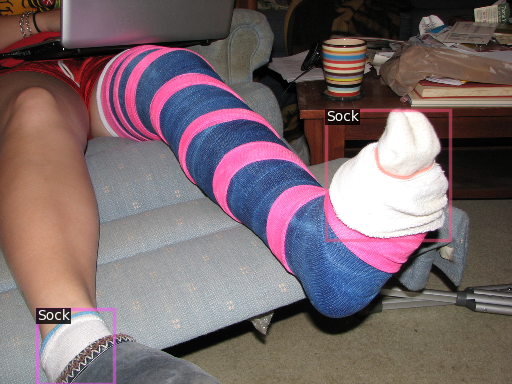

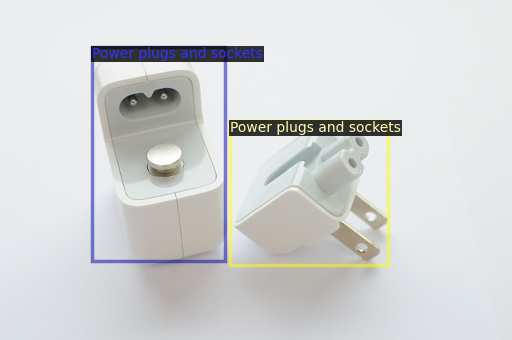

In [13]:

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=dataset_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [14]:
from detectron2.data import DatasetCatalog, MetadataCatalog

DatasetCatalog.register("validation_dataset", lambda: load_custom_dataset(val_save_path))
MetadataCatalog.get("validation_dataset").set(thing_classes=train_class_labels)

namespace(name='validation_dataset',
          thing_classes=['Torch',
                         'Toilet paper',
                         'Sunglasses',
                         'Spoon',
                         'Sock',
                         'Sandal',
                         'Remote control',
                         'Power plugs and sockets',
                         'Plate',
                         'Pen',
                         'Necklace',
                         'Mug',
                         'Mobile phone',
                         'Laptop',
                         'Kitchen knife',
                         'Headphones',
                         'Glove',
                         'Bottle',
                         'Belt',
                         'Ball'])

## Train!




In [15]:
# url ="COCO-Detection/faster_rcnn_R_50_DC5_3x.yaml"

In [16]:
url = "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"

In [17]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(url))
cfg.DATASETS.TRAIN = ("train_dataset",)
cfg.DATASETS.TEST = ("validation_dataset",)
cfg.DATALOADER.NUM_WORKERS = 4
# url1 = "/content/drive/MyDrive/try_model_0003699.pth"
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(url)  # Let training initialize from model zoo
# cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/try_model_0003699.pth"

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0002  #
cfg.SOLVER.MAX_ITER = 8000
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  # (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 20

cfg.SOLVER.CHECKPOINT_PERIOD = 500

print(cfg.MODEL.WEIGHTS)


https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl


In [18]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
cfg.MODEL.DEVICE = "cuda"
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[08/24 15:11:45 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_280758.pkl: 167MB [00:00, 194MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[08/24 15:11:47 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[08/24 15:12:05 d2.utils.events]:  eta: 0:55:14  iter: 19  total_loss: 3.148  loss_cls: 2.847  loss_box_reg: 0.2719  loss_rpn_cls: 0.01423  loss_rpn_loc: 0.01259    time: 0.4161  last_time: 0.5530  data_time: 0.0347  last_data_time: 0.0094   lr: 3.9962e-06  max_mem: 2637M
[08/24 15:12:19 d2.utils.events]:  eta: 0:53:32  iter: 39  total_loss: 3.054  loss_cls: 2.715  loss_box_reg: 0.2992  loss_rpn_cls: 0.007078  loss_rpn_loc: 0.008344    time: 0.4632  last_time: 0.4175  data_time: 0.0104  last_data_time: 0.0180   lr: 7.9922e-06  max_mem: 2637M
[08/24 15:12:27 d2.utils.events]:  eta: 0:54:22  iter: 59  total_loss: 2.789  loss_cls: 2.44  loss_box_reg: 0.3073  loss_rpn_cls: 0.006361  loss_rpn_loc: 0.007515    time: 0.4511  last_time: 0.3889  data_time: 0.0162  last_data_time: 0.0505   lr: 1.1988e-05  max_mem: 2638M
[08/24 15:12:36 d2.utils.events]:  eta: 0:54:17  iter: 79  total_loss: 2.533  loss_cls: 2.141  loss_box_reg: 0.265  loss_rpn_cls: 0.01828  loss_rpn_loc: 0.009033    time: 0.4429 

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [19]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [20]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[08/24 16:10:12 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


Then, we randomly select several samples to visualize the prediction results.

In [21]:
dataset_name = "validation_dataset"
dataset_metadata = MetadataCatalog.get(dataset_name)
dataset_dicts = DatasetCatalog.get(dataset_name)

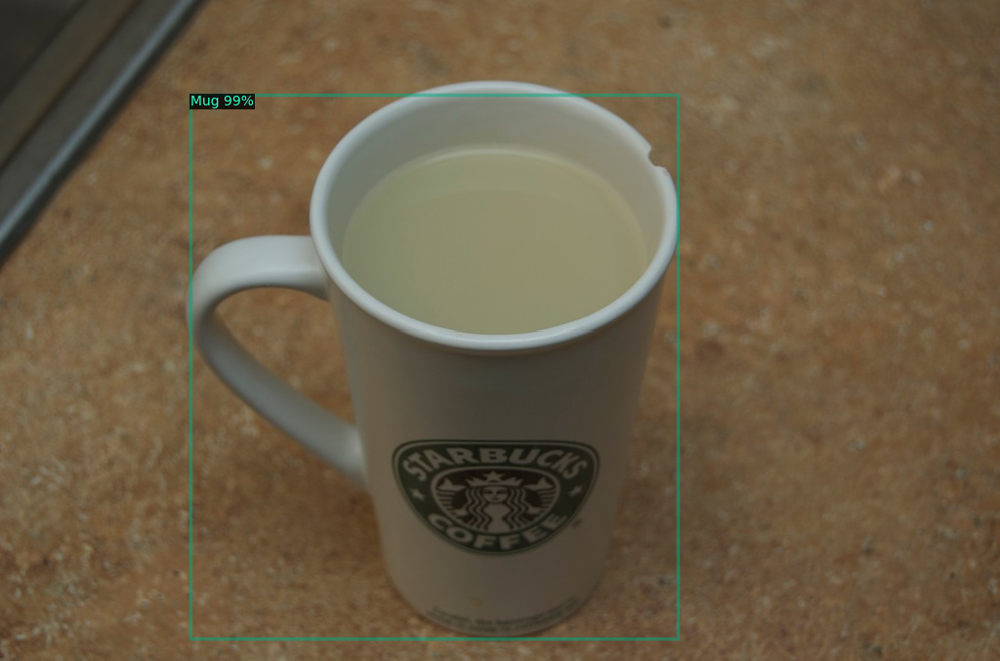

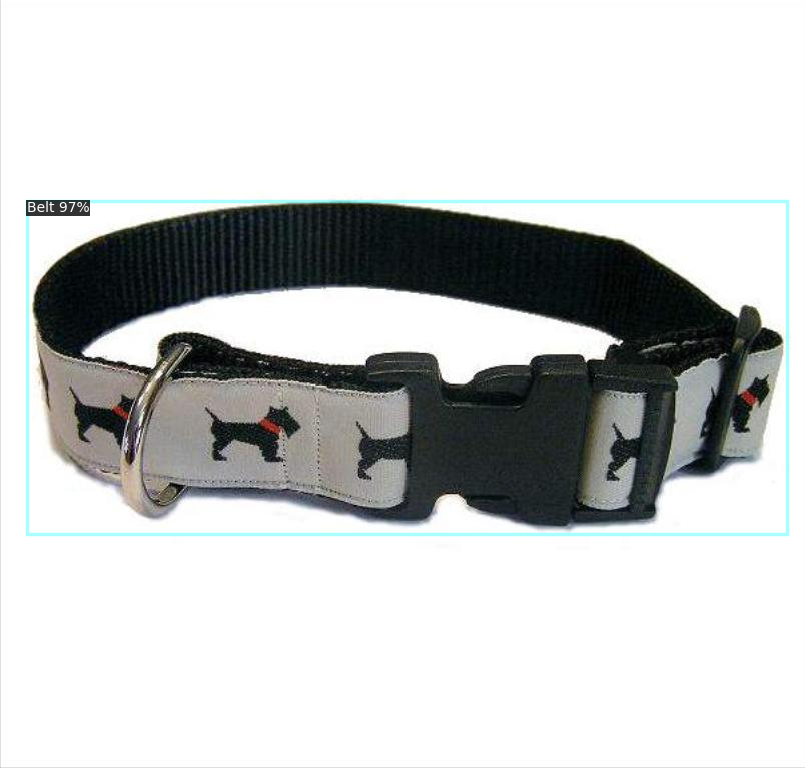

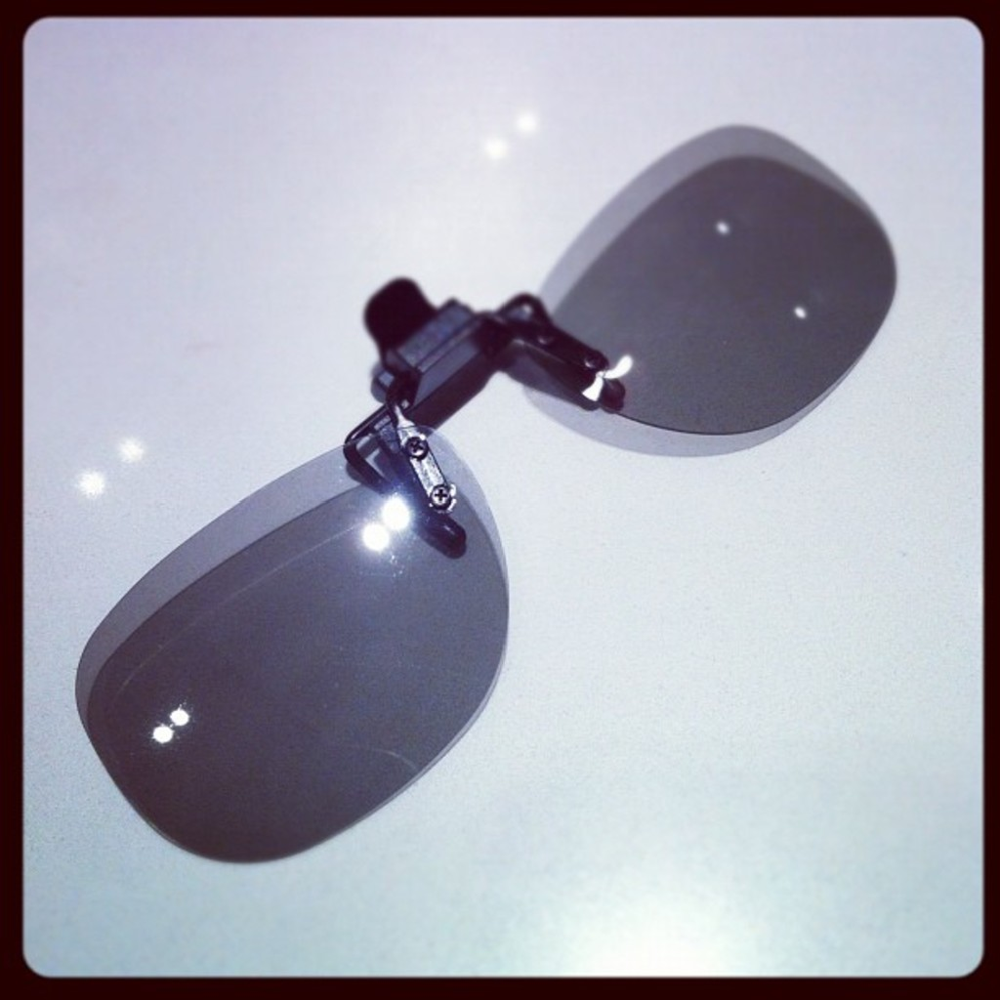

In [28]:
from detectron2.utils.visualizer import ColorMode
for d in random.sample(dataset_dicts, 3):

    img = cv2.imread(d["file_name"])
    outputs = predictor(img)

    visualizer = Visualizer(img[:, :, ::-1], metadata=dataset_metadata, scale=1)

    out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))

    cv2_imshow(out.get_image()[:, :, ::-1])
    # “pred_boxes”, “pred_classes”, “scores”,

In [23]:

# for d in random.sample(dataset_dicts, 3):
#     im = cv2.imread(d["file_name"])
#     outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
#     v = Visualizer(im[:, :, ::-1],
#                    metadata=balloon_metadata,
#                    scale=0.5,
#                    instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
#     )
#     out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
#     cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [25]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("validation_dataset", ("bbox",), False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "validation_dataset")
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[08/24 16:22:28 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[08/24 16:22:28 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/24 16:22:28 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[08/24 16:22:28 d2.data.common]: Serializing 94 elements to byte tensors and concatenating them all ...
[08/24 16:22:28 d2.data.common]: Serialized dataset takes 0.03 MiB
[08/24 16:22:28 d2.evaluation.evaluator]: Start inference on 94 batches


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[08/24 16:22:30 d2.evaluation.evaluator]: Inference done 11/94. Dataloading: 0.0010 s/iter. Inference: 0.0923 s/iter. Eval: 0.0003 s/iter. Total: 0.0936 s/iter. ETA=0:00:07
[08/24 16:22:35 d2.evaluation.evaluator]: Inference done 59/94. Dataloading: 0.0044 s/iter. Inference: 0.1001 s/iter. Eval: 0.0005 s/iter. Total: 0.1051 s/iter. ETA=0:00:03
[08/24 16:22:39 d2.evaluation.evaluator]: Total inference time: 0:00:09.722228 (0.109239 s / iter per device, on 1 devices)
[08/24 16:22:39 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:09 (0.102298 s / iter per device, on 1 devices)
[08/24 16:22:39 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[08/24 16:22:39 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[08/24 16:22:39 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
E

In [29]:
image_path = "/content/drive/MyDrive/twenty_class/validation/Ball/b70a9a76a7846b1e.jpg"
image = cv2.imread(image_path)  # Replace with your image path
output_dir = "/content/drive/MyDrive/"

# Get instance segmentation predictions
outputs = predictor(image)

boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
class_labels = outputs["instances"].pred_classes.cpu().numpy()

# Load class names from the COCO dataset
class_names = MetadataCatalog.get(cfg.DATASETS.TEST[0]).thing_classes

# Save the image with bounding boxes
output_image_path = "/content/drive/MyDrive/detected_image.jpg"
cv2.imwrite(output_image_path, image)

# Display the image using cv2_imshow()
# cv2_imshow(image)

True

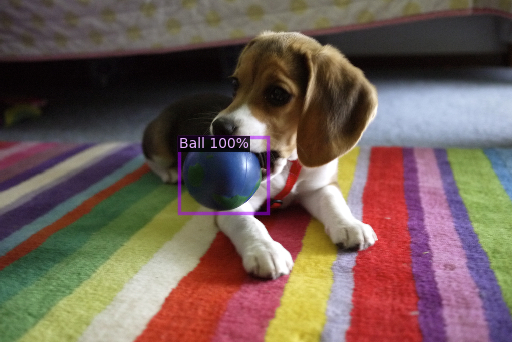

In [30]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.5)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [31]:
def ordinal(n):
    if 10 <= n % 100 <= 20:
        suffix = "th"
    else:
        suffix = {1: "st", 2: "nd", 3: "rd"}.get(n % 10, "th")
    return f"{n}{suffix}"

1 instance of Sock detected and is slightly to the left of the center.
2 instances of Sock detected; The 1st is slightly to the left of the center.; and The 2nd is slightly to the left of the center.
Sock: 2


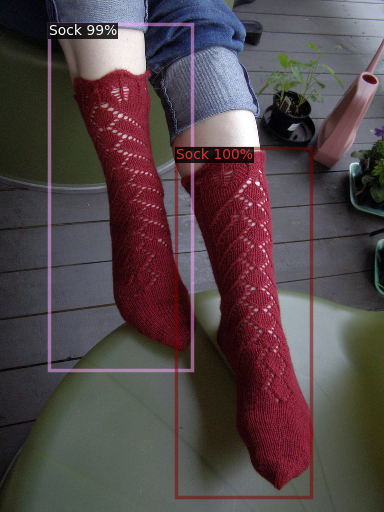

In [42]:
from collections import Counter
# Load an image
image_path = "/content/drive/MyDrive/OIDv4_ToolKit/OID/Dataset/test/Sock/532eabb4eaae9564.jpg"
image = cv2.imread(image_path)  # Replace with your image path

# Get instance segmentation predictions
outputs = predictor(image)

boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
class_labels = outputs["instances"].pred_classes.cpu().numpy()

# Load class names from the COCO dataset
class_names = MetadataCatalog.get(cfg.DATASETS.TEST[0]).thing_classes

# Calculate the center of the image
image_height, image_width, _ = image.shape
center_x = image_width // 2

# Create a dictionary to store the count of each class label
label_counts = Counter()


# Loop through each detected object and generate text output
for box, label in zip(boxes, class_labels):
    label_name = class_names[label]
    if label_name == "N/A":
        label_name = "Unknown"

    # Count the occurrences of the label
    label_counts[label_name] += 1

    # Get the position information from the bounding box
    x_min, _, x_max, _ = box

    # Calculate the position relative to the center
    object_position = "to the left" if x_min < center_x else "to the right"
    distance_from_center = abs(center_x - (x_min + x_max) / 2)

    # Generate the distance description based on relative position
    if distance_from_center < image_width * 0.1:
        distance_description = "very close to"
    elif distance_from_center < image_width * 0.3:
        distance_description = "slightly"
    elif distance_from_center < image_width * 0.6:
        distance_description = "moderately"
    else:
        distance_description = "further"

    # Generate the text output for each instance of the object
    if label_counts[label_name] == 1:
        object_description = f"{label_counts[label_name]} instance of {label_name} detected and is {distance_description} {object_position} of the center."
    else:
        instance_description = [f"The {ordinal(n)} is {distance_description} {object_position} of the center." for n in range(1, label_counts[label_name] + 1)]
        object_description = f"{label_counts[label_name]} instances of {label_name} detected; {', '.join(instance_description[:-1])}; and {instance_description[-1]}"

    print(object_description)



# Print the occurrences of each class label
for label, count in label_counts.items():
    print(f"{label}: {count}")

# Display the image with bounding boxes
output_image_path = "/content/drive/MyDrive/detected_image.jpg"
cv2.imwrite(output_image_path, image)

# Display the image using cv2_imshow()
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.5)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])
